In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 22.6 MB/s eta 0:00:00



image 1/1 /content/ffmpeg_frame_공학관.png: 384x640 1 person, 3 cars, 2 trucks, 105.4ms
Speed: 11.4ms preprocess, 105.4ms inference, 62.5ms postprocess per image at shape (1, 3, 384, 640)


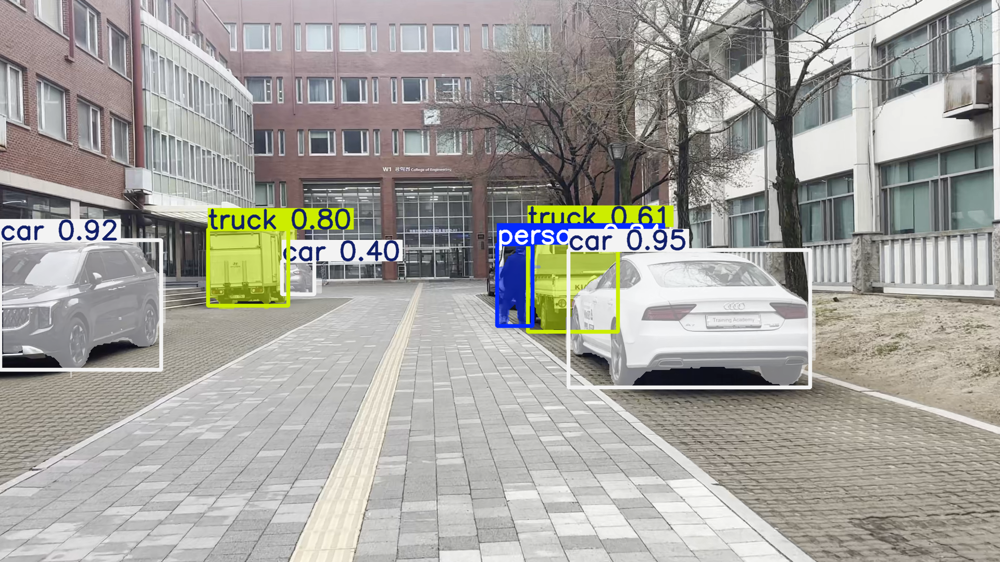

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLO26 segmentation model
model = YOLO("yolo26s-seg.pt")

# Run inference on an image
results = model("/content/ffmpeg_frame_공학관.png")

# Visualize the results
# This will display the image with the segmentation masks overlaid
results[0].show()


Yolo11 segmentation cityscape test_gpt 버전

In [ ]:
!pip install -U ultralytics

In [ ]:
import os
import cv2
import numpy as np
from glob import glob

MASK_DIR = "/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001/MASK"  # 경로 맞게 수정

mask_files = sorted(glob(os.path.join(MASK_DIR, "*")))
print("num masks:", len(mask_files))
print("sample:", mask_files[:5])

sample = mask_files[0]
mask = cv2.imread(sample, cv2.IMREAD_UNCHANGED)

print("sample mask path:", sample)
print("shape:", mask.shape)
print("dtype:", mask.dtype)

if mask.ndim == 2:
    vals = np.unique(mask)
    print("unique values:", vals[:50], "count=", len(vals))
else:
    rgb = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    pixels = rgb.reshape(-1, 3)
    uniq = np.unique(pixels, axis=0)
    print("unique colors:", uniq[:20], "count=", len(uniq))

num masks: 119
sample: ['/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001/MASK/MP_SEL_SUR_000001.png', '/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001/MASK/MP_SEL_SUR_000002.png', '/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001/MASK/MP_SEL_SUR_000003.png', '/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001/MASK/MP_SEL_SUR_000004.png', '/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001/MASK/MP_SEL_SUR_000005.png']
sample mask path: /content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001/MASK/MP_SEL_SUR_000001.png
shape: (1080, 1920, 3)
dtype: uint8
unique colors: [[  0   0   0]
 [230 170 255]] count= 2


In [ ]:
import xml.etree.ElementTree as ET

xml_path = "/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001/15_SM0915_01.xml"

tree = ET.parse(xml_path)
root = tree.getroot()

print("root:", root.tag)
for child in root:
    print(child.tag, child.attrib)
    if list(child):
        for sub in child[:10]:
            print("   ", sub.tag, sub.attrib, sub.text)

root: annotations
version {}
meta {}
    task {} 
      
    dumped {} 2019-10-29 21:00:24.595395+03:00
image {'id': '0', 'name': 'MP_SEL_SUR_000001.jpg', 'width': '1920', 'height': '1080'}
    polygon {'label': 'alley', 'occluded': '0', 'points': '1267.80,0.00;1464.80,434.60;1790.20,1080.00;0.00,1080.00;0.00,308.32;110.55,185.95;126.30,168.20;175.70,206.90;225.40,208.10;274.50,176.20;287.90,135.30;290.90,41.90;286.30,0.00;576.35,0.00', 'z_order': '6'} 
      
image {'id': '1', 'name': 'MP_SEL_SUR_000002.jpg', 'width': '1920', 'height': '1080'}
    polygon {'label': 'roadway', 'occluded': '0', 'points': '1920.00,0.00;1202.90,0.00;1320.30,123.60;1470.50,280.50;1784.20,610.00;1920.00,765.23', 'z_order': '2'} 
      
    polygon {'label': 'sidewalk', 'occluded': '0', 'points': '1143.80,0.00;1137.60,44.80;1074.00,45.30;1083.17,87.54;1246.70,84.90;1217.30,47.80;1192.80,46.80;1193.50,0.00;1202.20,0.00;1508.30,321.20;1920.00,760.80;1920.00,1080.00;1245.00,1080.00;1153.80,624.20;1037.20,0.00',

In [ ]:
xml_text = open(xml_path, "r", encoding="utf-8").read()
print(xml_text[:2000])

<?xml version="1.0" encoding="utf-8"?>
<annotations>
  <version>1.1</version>
  <meta>
    <task>
      <id>15</id>
      <name>SM0915_01</name>
      <size>120</size>
      <mode>annotation</mode>
      <overlap>0</overlap>
      <bugtracker></bugtracker>
      <flipped>False</flipped>
      <created>2019-09-26 05:39:45.744453+03:00</created>
      <updated>2019-10-10 11:37:15.776325+03:00</updated>
      <start_frame>0</start_frame>
      <stop_frame>0</stop_frame>
      <frame_filter>0</frame_filter>
      <labels>
        <label>
          <name>caution_zone</name>
          <attributes>
            <attribute>
              <name>attribute</name>
              <mutable>False</mutable>
              <input_type>radio</input_type>
              <default_value>stairs</default_value>
              <values>stairs
manhole
tree_zone
grating
repair_zone</values>
            </attribute>
          </attributes>
        </label>
        <label>
          <name>bike_lane</name>
          <at

In [ ]:
def canonical_raw_label(label: str, attr: str | None):
    label = label.strip().lower()
    attr = (attr or "").strip().lower()

    if label == "sidewalk":
        if attr:
            return f"sidewalk_{attr}"
        return "sidewalk"

    if label == "braille_guide_blocks":
        if attr in ["normal", "damaged"]:
            return f"braille_guide_blocks_{attr}"
        return "braille_guide_blocks"

    if label == "roadway":
        if attr in ["normal", "crosswalk"]:
            return f"roadway_{attr}"
        return "roadway"

    if label == "alley":
        if attr in ["normal", "crosswalk", "speed_bump", "damaged"]:
            return f"alley_{attr}"
        return "alley"

    if label == "caution_zone":
        if attr in ["stairs", "manhole", "tree_zone", "grating", "repair_zone"]:
            return f"caution_zone_{attr}"
        return "caution_zone"

    if label == "bike_lane":
        return "bike_lane"

    return label

In [ ]:
def map_raw_to_5class(raw: str):
    raw = raw.lower()

    # 1) braille
    if raw.startswith("braille_guide_blocks"):
        return 1  # braille_guide_blocks

    # 2) crosswalk를 roadway/alley보다 먼저 분기
    if raw in ["roadway_crosswalk", "alley_crosswalk"]:
        return 4  # crosswalk

    # 3) roadway (crosswalk 제외)
    if raw.startswith("roadway"):
        return 3  # roadway

    # 4) caution
    if raw.startswith("bike_lane") or raw.startswith("caution_zone"):
        return 2  # caution_surface

    # 5) walkable
    if raw.startswith("sidewalk") or raw.startswith("alley"):
        return 0  # walkable_surface

    return None

In [ ]:
import os
import xml.etree.ElementTree as ET

def parse_points(points_str):
    pts = []
    for p in points_str.split(";"):
        x, y = p.split(",")
        pts.append((float(x), float(y)))
    return pts

def polygon_to_yolo_line(class_id, pts, w, h):
    vals = []
    for x, y in pts:
        vals.append(f"{x / w:.6f}")
        vals.append(f"{y / h:.6f}")
    return f"{class_id} " + " ".join(vals)

def get_polygon_attr(poly):
    for child in poly:
        if child.tag == "attribute":
            return (child.text or "").strip()
    return None

def convert_xml_to_yolo_labels(xml_path, out_label_dir, mapping="5class"):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    for image_tag in root.findall("image"):
        img_name = image_tag.attrib["name"]
        w = int(image_tag.attrib["width"])
        h = int(image_tag.attrib["height"])

        lines = []

        for poly in image_tag.findall("polygon"):
            label = poly.attrib["label"]
            points_str = poly.attrib["points"]
            attr = get_polygon_attr(poly)

            raw = canonical_raw_label(label, attr)

            if mapping == "5class":
                class_id = map_raw_to_5class(raw)
            else:
                raise NotImplementedError("지금은 5class만 구현")

            if class_id is None:
                continue

            pts = parse_points(points_str)
            if len(pts) < 3:
                continue

            line = polygon_to_yolo_line(class_id, pts, w, h)
            lines.append(line)

        txt_name = os.path.splitext(img_name)[0] + ".txt"
        txt_path = os.path.join(out_label_dir, txt_name)

        with open(txt_path, "w", encoding="utf-8") as f:
            f.write("\n".join(lines))

In [ ]:
import os
import glob
import shutil
import random
import xml.etree.ElementTree as ET
from tqdm import tqdm

SRC_ROOT = "/content/drive/MyDrive/capstone dataset"
OUT_ROOT = "/content/drive/MyDrive/aihub_surface_yolo_5cls_full"

SEED = 42
TRAIN_RATIO = 0.8
VAL_RATIO = 0.1
TEST_RATIO = 0.1

assert abs(TRAIN_RATIO + VAL_RATIO + TEST_RATIO - 1.0) < 1e-6

random.seed(SEED)

for d in [
    f"{OUT_ROOT}/images/train",
    f"{OUT_ROOT}/images/val",
    f"{OUT_ROOT}/images/test",
    f"{OUT_ROOT}/labels/train",
    f"{OUT_ROOT}/labels/val",
    f"{OUT_ROOT}/labels/test",
]:
    os.makedirs(d, exist_ok=True)


def canonical_raw_label(label: str, attr: str | None):
    label = label.strip().lower()
    attr = (attr or "").strip().lower()

    if label == "sidewalk":
        return f"sidewalk_{attr}" if attr else "sidewalk"

    if label == "braille_guide_blocks":
        if attr in ["normal", "damaged"]:
            return f"braille_guide_blocks_{attr}"
        return "braille_guide_blocks"

    if label == "roadway":
        if attr in ["normal", "crosswalk"]:
            return f"roadway_{attr}"
        return "roadway"

    if label == "alley":
        if attr in ["normal", "crosswalk", "speed_bump", "damaged"]:
            return f"alley_{attr}"
        return "alley"

    if label == "caution_zone":
        if attr in ["stairs", "manhole", "tree_zone", "grating", "repair_zone"]:
            return f"caution_zone_{attr}"
        return "caution_zone"

    if label == "bike_lane":
        return "bike_lane"

    return label



def map_raw_to_5class(raw: str):
    raw = raw.lower()

    # 1) braille
    if raw.startswith("braille_guide_blocks"):
        return 1  # braille_guide_blocks

    # 2) crosswalk를 roadway/alley보다 먼저 분기
    if raw in ["roadway_crosswalk", "alley_crosswalk"]:
        return 4  # crosswalk

    # 3) roadway (crosswalk 제외)
    if raw.startswith("roadway"):
        return 3  # roadway

    # 4) caution
    if raw.startswith("bike_lane") or raw.startswith("caution_zone"):
        return 2  # caution_surface

    # 5) walkable
    if raw.startswith("sidewalk") or raw.startswith("alley"):
        return 0  # walkable_surface

    return None


def parse_points(points_str):
    pts = []
    for p in points_str.split(";"):
        x, y = p.split(",")
        pts.append((float(x), float(y)))
    return pts


def polygon_to_yolo_line(class_id, pts, w, h):
    vals = []
    for x, y in pts:
        vals.append(f"{x / w:.6f}")
        vals.append(f"{y / h:.6f}")
    return f"{class_id} " + " ".join(vals)


def get_polygon_attr(poly):
    for child in poly:
        if child.tag == "attribute":
            return (child.text or "").strip()
    return None

def collect_annotations_from_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    result = {}

    for image_tag in root.findall("image"):
        img_name = image_tag.attrib["name"]
        w = int(float(image_tag.attrib["width"]))
        h = int(float(image_tag.attrib["height"]))

        lines = []
        for poly in image_tag.findall("polygon"):
            label = poly.attrib["label"]
            points_str = poly.attrib["points"]
            attr = get_polygon_attr(poly)

            raw = canonical_raw_label(label, attr)
            class_id = map_raw_to_5class(raw)

            if class_id is None:
                continue

            pts = parse_points(points_str)
            if len(pts) < 3:
                continue

            lines.append(polygon_to_yolo_line(class_id, pts, w, h))

        result[img_name] = lines

    return result

surface_dirs = sorted(glob.glob(os.path.join(SRC_ROOT, "Surface_*_unzipped", "Surface_*")))
print("num surface dirs:", len(surface_dirs))
print("sample dirs:", surface_dirs[:5])

random.shuffle(surface_dirs)

n_total = len(surface_dirs)
n_train = int(n_total * TRAIN_RATIO)
n_val = int(n_total * VAL_RATIO)
n_test = n_total - n_train - n_val

train_dirs = surface_dirs[:n_train]
val_dirs = surface_dirs[n_train:n_train + n_val]
test_dirs = surface_dirs[n_train + n_val:]

print("total dirs :", n_total)
print("train dirs :", len(train_dirs))
print("val dirs   :", len(val_dirs))
print("test dirs  :", len(test_dirs))

def process_split(surface_dir_list, split_name):
    img_out = f"{OUT_ROOT}/images/{split_name}"
    lab_out = f"{OUT_ROOT}/labels/{split_name}"

    total_imgs = 0
    xml_cache = {}

    for sdir in tqdm(surface_dir_list, desc=f"Processing {split_name}"):
        xmls = glob.glob(os.path.join(sdir, "*.xml"))
        if len(xmls) != 1:
            print(f"[SKIP] xml 개수 이상함: {sdir} -> {xmls}")
            continue

        xml_path = xmls[0]

        if xml_path not in xml_cache:
            xml_cache[xml_path] = collect_annotations_from_xml(xml_path)

        ann_dict = xml_cache[xml_path]

        jpgs = sorted(glob.glob(os.path.join(sdir, "*.jpg")))
        if len(jpgs) == 0:
            jpgs = sorted(glob.glob(os.path.join(sdir, "*.png")))

        for img_path in jpgs:
            img_name = os.path.basename(img_path)
            txt_name = os.path.splitext(img_name)[0] + ".txt"
            lines = ann_dict.get(img_name, [])

            shutil.copy(img_path, os.path.join(img_out, img_name))

            with open(os.path.join(lab_out, txt_name), "w", encoding="utf-8") as f:
                f.write("\n".join(lines))

            total_imgs += 1

    print(f"{split_name} images:", total_imgs)


process_split(train_dirs, "train")
process_split(val_dirs, "val")
process_split(test_dirs, "test")

print("conversion done")

num surface dirs: 222
sample dirs: ['/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_001', '/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_002', '/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_003', '/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_004', '/content/drive/MyDrive/capstone dataset/Surface_1_unzipped/Surface_005']
total dirs : 222
train dirs : 177
val dirs   : 22
test dirs  : 23


Processing train: 100%|██████████| 177/177 [58:21<00:00, 19.78s/it]


train images: 10505


Processing val: 100%|██████████| 22/22 [07:08<00:00, 19.49s/it]


val images: 1299


Processing test: 100%|██████████| 23/23 [07:23<00:00, 19.27s/it]

test images: 1402
conversion done


In [ ]:
yaml_text = f"""path: {OUT_ROOT}
train: images/train
val: images/val
test: images/test

names:
  0: walkable_surface
  1: braille_guide_blocks
  2: caution_surface
  3: roadway
  4: crosswalk
"""

yaml_path = f"{OUT_ROOT}/data.yaml"

with open(yaml_path, "w", encoding="utf-8") as f:
    f.write(yaml_text)

print("saved data.yaml")
print(open(yaml_path, "r", encoding="utf-8").read())

saved data.yaml
path: /content/drive/MyDrive/aihub_surface_yolo_5cls_full
train: images/train
val: images/val
test: images/test

names:
  0: walkable_surface
  1: braille_guide_blocks
  2: caution_surface
  3: roadway
  4: crosswalk



In [ ]:
print("train images:", len(glob.glob(f"{OUT_ROOT}/images/train/*")))
print("val images  :", len(glob.glob(f"{OUT_ROOT}/images/val/*")))
print("test images :", len(glob.glob(f"{OUT_ROOT}/images/test/*")))

print("train labels:", len(glob.glob(f"{OUT_ROOT}/labels/train/*")))
print("val labels  :", len(glob.glob(f"{OUT_ROOT}/labels/val/*")))
print("test labels :", len(glob.glob(f"{OUT_ROOT}/labels/test/*")))

train images: 10505
val images  : 1299
test images : 1402
train labels: 10505
val labels  : 1299
test labels : 1402


In [ ]:
sample_label = sorted(glob.glob(f"{OUT_ROOT}/labels/train/*.txt"))[:3]
for p in sample_label:
    print("==", p)
    with open(p, "r", encoding="utf-8") as f:
        print(f.read()[:500])

== /content/drive/MyDrive/aihub_surface_yolo_5cls_full/labels/train/MP_SEL_SUR_000001.txt
0 0.660312 0.000000 0.762917 0.402407 0.932396 1.000000 0.000000 1.000000 0.000000 0.285481 0.057578 0.172176 0.065781 0.155741 0.091510 0.191574 0.117396 0.192685 0.142969 0.163148 0.149948 0.125278 0.151510 0.038796 0.149115 0.000000 0.300182 0.000000
== /content/drive/MyDrive/aihub_surface_yolo_5cls_full/labels/train/MP_SEL_SUR_000002.txt
3 1.000000 0.000000 0.626510 0.000000 0.687656 0.114444 0.765885 0.259722 0.929271 0.564815 1.000000 0.708546
0 0.595729 0.000000 0.592500 0.041481 0.559375 0.041944 0.564151 0.081056 0.649323 0.078611 0.634010 0.044259 0.621250 0.043333 0.621615 0.000000 0.626146 0.000000 0.785573 0.297407 1.000000 0.704444 1.000000 1.000000 0.648438 1.000000 0.600938 0.577963 0.540208 0.000000
2 0.539755 0.000546 0.558682 0.183306 0.577505 0.362519 0.619563 0.765685 0.648229 1.000000 0.309688 0.998981 0.000000
== /content/drive/MyDrive/aihub_surface_yolo_5cls_full/labels/tra

In [ ]:
# 라벨 분포 빠르게 확인
import glob, collections

label_files = glob.glob(f"{OUT_ROOT}/labels/train/*.txt")
cls_count = collections.Counter()

for f in label_files:
    for line in open(f).readlines():
        if line.strip():
            cls_count[int(line.split()[0])] += 1

print(cls_count)
# 예: Counter({0: 50000, 3: 30000, 1: 2000, ...})
# braille(1)이 너무 적으면 → cls weight 조정 필요

Counter({0: 20692, 2: 11956, 3: 6660, 1: 2935, 4: 1235})


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.1 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

OUT_ROOT = "/content/drive/MyDrive/aihub_surface_yolo_5cls_full"
model = YOLO("yolo26n-seg.pt")

model.train(
    data=f"{OUT_ROOT}/data.yaml",
    epochs=80,
    imgsz=480,
    batch=8,
    device=0,
    cache=True,
    patience=15,
    workers=2,          # Colab은 2~4 권장 (너무 높으면 RAM 터짐)

    # 세그멘테이션 품질
    retina_masks=True,  # 고해상도 마스크
    overlap_mask=True,  # 겹치는 마스크 허용
    mask_ratio=4,       # 마스크 해상도 (기본값, 낮출수록 정밀)

    # 클래스 불균형 대응 (braille_guide_blocks가 적을 수 있음)
    cls=0.5,

    # 증강 (도로 데이터에 적합)
    fliplr=0.5,
    degrees=5.0,        # 소폭 회전만 (도로는 크게 기울지 않음)
    perspective=0.0003,

    close_mosaic=10,    # 마지막 10 epoch에서 mosaic 끄기 (수렴 안정화)
    project="/content/drive/MyDrive/yolo_surface_runs",
    name="yolo26n_seg_surface_5cls_full"
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/aihub_surface_yolo_5cls_full/data.yaml, degrees=5.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=Fal

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7dda21e54740>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,  

### yolo26 n seg surface 경량화

기본 tflite

In [ ]:
!pip uninstall -y torch torchvision torchaudio ultralytics
!pip install -U torch torchvision torchaudio
!pip install -U ultralytics

Found existing installation: torch 2.10.0+cu128
Uninstalling torch-2.10.0+cu128:
  Successfully uninstalled torch-2.10.0+cu128
Found existing installation: torchvision 0.25.0+cu128
Uninstalling torchvision-0.25.0+cu128:
  Successfully uninstalled torchvision-0.25.0+cu128
Found existing installation: torchaudio 2.10.0+cu128
Uninstalling torchaudio-2.10.0+cu128:
  Successfully uninstalled torchaudio-2.10.0+cu128
Found existing installation: ultralytics 8.4.46
Uninstalling ultralytics-8.4.46:
  Successfully uninstalled ultralytics-8.4.46
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 530.7/530.7 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 366.1/366.1 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.9/169.9 MB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.5/196.5 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 MB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 423.1/423.1 MB

  Using cached ultralytics-8.4.46-py3-none-any.whl.metadata (39 kB)
Using cached ultralytics-8.4.46-py3-none-any.whl (1.2 MB)


In [ ]:
from ultralytics import YOLO

# 학습한 best.pt 경로로 변경
model = YOLO("/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.pt")

# INT8 TFLite export
export_path = model.export(
    format="tflite",
    imgsz=320,
    int8=True
)

print(export_path)

Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.11.0+cu130 CPU (Intel Xeon CPU @ 2.20GHz)
WARNING ⚠️ INT8 export requires a missing 'data' arg for calibration. Using default 'data=coco8-seg.yaml'.
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO26n-seg summary (fused): 139 layers, 2,689,664 parameters, 0 gradients, 9.0 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.pt' with input shape (1, 3, 320, 320) BCHW and output shape(s) ((1, 300, 38), (1, 32, 80, 80)) (6.2 MB)
TensorFlow SavedModel: collecting INT8 calibration images from 'data=coco8-seg.yaml'

WARNING ⚠️ Dataset 'coco8-seg.yaml' images not found, missing path '/content/datasets/coco8-seg/images/val'
Unzipping /content/datasets/coco8-seg.zip to /content/datasets/coco8-seg...: 100% ━━━━━━━━━━━━ 25/25 3.6Kfiles/s 0.0s
Dataset download success ✅ (0.6s), saved to /content/

/usr/local/lib/python3.12/dist-packages/torch/onnx/_internal/torchscript_exporter/symbolic_opset11.py:954: UserWarning: Exporting aten::index operator of advanced indexing in opset 20 is achieved by combination of multiple ONNX operators, including Reshape, Transpose, Concat, and Gather. If indices include negative values, the exported graph will produce incorrect results.
  return opset9.index(g, self, index)


ONNX: slimming with onnxslim 0.1.92...
ONNX: export success ✅ 6.5s, saved as '/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.onnx' (10.5 MB)
requirements: Ultralytics requirements ['tf_keras<=2.19.0', 'sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'ai-edge-litert>=1.2.0', 'onnx2tf>=1.26.3,<1.29.0'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 45 packages in 15.11s
Prepared 8 packages in 8.12s
Uninstalled 3 packages in 992ms
Installed 8 packages in 400ms
 + ai-edge-litert==2.1.4
 + backports-strenum==1.3.1
 + onnx-graphsurgeon==0.6.1
 + onnx2tf==1.28.8
 + sng4onnx==2.0.1
 - tensorboard==2.20.0
 + tensorboard==2.19.0
 - tensorflow==2.20.0
 + tensorflow==2.19.1
 - tf-keras==2.20.0
 + tf-keras==2.19.0

requirements: AutoUpdate success ✅ 25.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


TensorFlow SavedModel: starting export with tensorflow 2.20.0...
Unzipping calibrati

int8 + 하단 crop tesst

In [ ]:
from ultralytics import YOLO
import cv2
import time
import os
import matplotlib.pyplot as plt

from ultralytics import YOLO

TFLITE_MODEL_PATH = "/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best_saved_model/best_int8.tflite"

model = YOLO(TFLITE_MODEL_PATH)
IMG_PATH = "/content/ffmpeg_frame_공학관.png"   # 테스트할 이미지 경로로 바꿔줘

img = cv2.imread(IMG_PATH)
assert img is not None, f"이미지 로드 실패: {IMG_PATH}"

h, w = img.shape[:2]
crop = img[h//2:, :]   # 아래 절반만 사용

crop_path = "/content/test_image_bottom_half.png"
cv2.imwrite(crop_path, crop)

print("original shape:", img.shape)
print("crop shape    :", crop.shape)
print("saved crop to :", crop_path)

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
original shape: (1080, 1920, 3)
crop shape    : (540, 1920, 3)
saved crop to : /content/test_image_bottom_half.png


In [ ]:
# warm-up
_ = model.predict(source=IMG_PATH, imgsz=640, save=False, verbose=False)

times_full = []
for _ in range(10):
    start = time.time()
    results_full = model.predict(
        source=IMG_PATH,
        imgsz=640,
        save=False,
        verbose=False
    )
    end = time.time()
    times_full.append(end - start)

avg_full = sum(times_full) / len(times_full)
print(f"[FULL] avg time: {avg_full:.4f} sec | FPS: {1/avg_full:.2f}")
print("[FULL] speed:", results_full[0].speed)

[FULL] avg time: 0.1383 sec | FPS: 7.23
[FULL] speed: {'preprocess': 2.3205879999750323, 'inference': 69.17255600001226, 'postprocess': 2.6871920001667604}


In [ ]:
# warm-up
_ = model.predict(source=crop_path, imgsz=640, save=False, verbose=False)

times_crop = []
for _ in range(10):
    start = time.time()
    results_crop = model.predict(
        source=crop_path,
        imgsz=640,
        save=False,
        verbose=False
    )
    end = time.time()
    times_crop.append(end - start)

avg_crop = sum(times_crop) / len(times_crop)
print(f"[BOTTOM HALF] avg time: {avg_crop:.4f} sec | FPS: {1/avg_crop:.2f}")
print("[BOTTOM HALF] speed:", results_crop[0].speed)

[BOTTOM HALF] avg time: 0.0783 sec | FPS: 12.78
[BOTTOM HALF] speed: {'preprocess': 1.2605430001713103, 'inference': 49.33034000009684, 'postprocess': 1.7578110000613378}


In [ ]:
# warm-up
_ = model.predict(source=crop_path, imgsz=640, save=False, verbose=False)

times_crop = []
for _ in range(10):
    start = time.time()
    results_crop = model.predict(
        source=crop_path,
        imgsz=320,
        save=False,
        verbose=False
    )
    end = time.time()
    times_crop.append(end - start)

avg_crop = sum(times_crop) / len(times_crop)
print(f"[BOTTOM HALF] avg time: {avg_crop:.4f} sec | FPS: {1/avg_crop:.2f}")
print("[BOTTOM HALF] speed:", results_crop[0].speed)

Loading /content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best_saved_model/best_int8.tflite for TensorFlow Lite inference...
[BOTTOM HALF] avg time: 0.0513 sec | FPS: 19.49
[BOTTOM HALF] speed: {'preprocess': 0.8817179996185587, 'inference': 22.21106800061534, 'postprocess': 0.3988720000052126}


In [ ]:
from ultralytics import YOLO

MODEL_PATH = "/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.pt"

model = YOLO(MODEL_PATH)

print("model task:", model.task)
print("class names:", model.names)
print("num classes:", len(model.names))

model task: segment
class names: {0: 'walkable_surface', 1: 'braille_guide_blocks', 2: 'caution_surface', 3: 'roadway'}
num classes: 4


imgsz=320
avg_time: 0.1532 sec
FPS: 6.53
speed: {'preprocess': 0.9996199999022792, 'inference': 12.993591999929777, 'postprocess': 1.7156040000827488}
boxes: 5
has masks: True
mask shape: torch.Size([5, 1640, 2922])


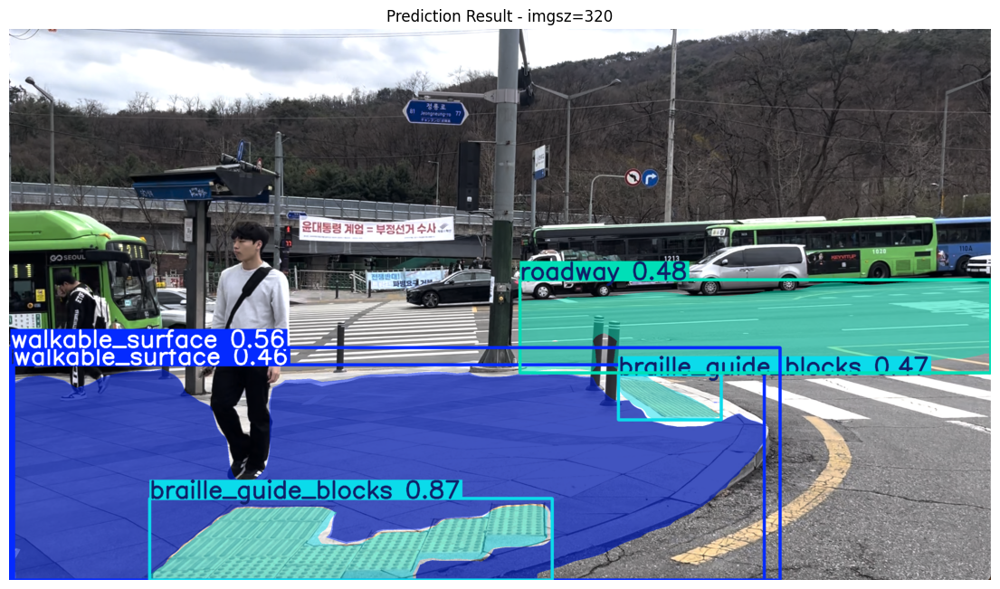

imgsz=480
avg_time: 0.1523 sec
FPS: 6.57
speed: {'preprocess': 1.5312610000819404, 'inference': 12.79337599999053, 'postprocess': 2.2464700000455196}
boxes: 8
has masks: True
mask shape: torch.Size([8, 1640, 2922])


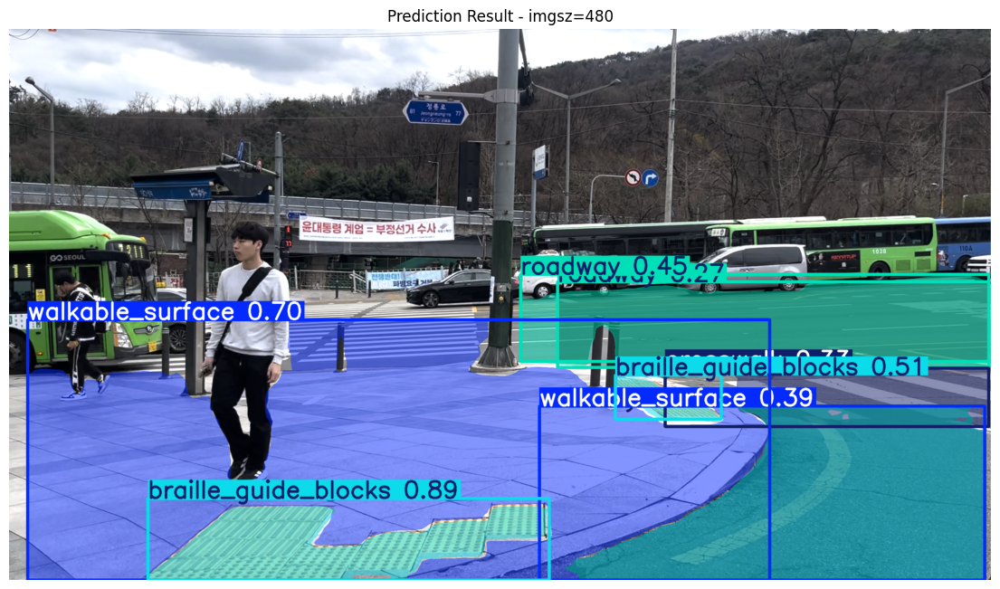

imgsz=640
avg_time: 0.1519 sec
FPS: 6.58
speed: {'preprocess': 2.309156999899642, 'inference': 12.947359000008873, 'postprocess': 2.2316199999750097}
boxes: 8
has masks: True
mask shape: torch.Size([8, 1640, 2922])


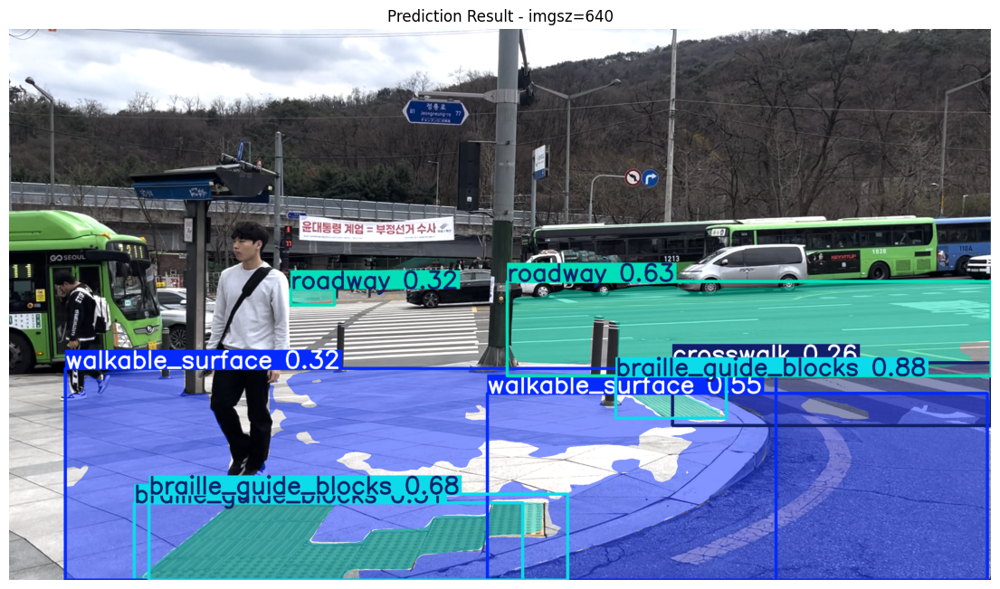

imgsz=960
avg_time: 0.1547 sec
FPS: 6.46
speed: {'preprocess': 4.255939000131548, 'inference': 13.0543289999423, 'postprocess': 2.4675130000559875}
boxes: 9
has masks: True
mask shape: torch.Size([9, 1640, 2922])


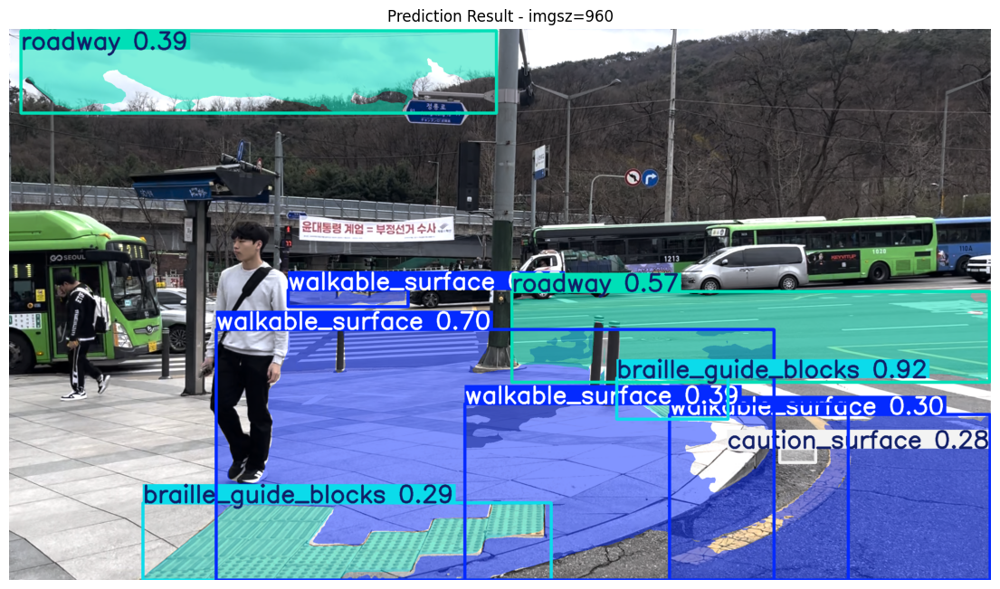

In [ ]:
from ultralytics import YOLO
import time
import cv2
import matplotlib.pyplot as plt

model = YOLO("/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_5cls_full/weights/best.pt")

TEST_IMG = "/content/정문2.png"

sizes = [320, 480, 640, 960]

for size in sizes:
    # warm-up
    _ = model.predict(
        source=TEST_IMG,
        imgsz=size,
        conf=0.25,
        save=False,
        verbose=False,
        retina_masks=True
    )

    times = []
    results = None

    for _ in range(10):
        start = time.time()

        results = model.predict(
            source=TEST_IMG,
            imgsz=size,
            conf=0.25,
            save=False,
            verbose=False,
            retina_masks=True
        )

        end = time.time()
        times.append(end - start)

    avg = sum(times) / len(times)
    r = results[0]

    print("=" * 80)
    print(f"imgsz={size}")
    print(f"avg_time: {avg:.4f} sec")
    print(f"FPS: {1/avg:.2f}")
    print("speed:", r.speed)
    print("boxes:", None if r.boxes is None else len(r.boxes))
    print("has masks:", r.masks is not None)

    if r.masks is not None:
        print("mask shape:", r.masks.data.shape)

    # 예측 결과 이미지 그리기
    result_img = r.plot(
        boxes=True,
        masks=True,
        labels=True,
        conf=True
    )

    plt.figure(figsize=(14, 8))
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"Prediction Result - imgsz={size}")
    plt.show()

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
PT full
task: segment
boxes: 6
has masks: True
mask shape: torch.Size([6, 1080, 1920])


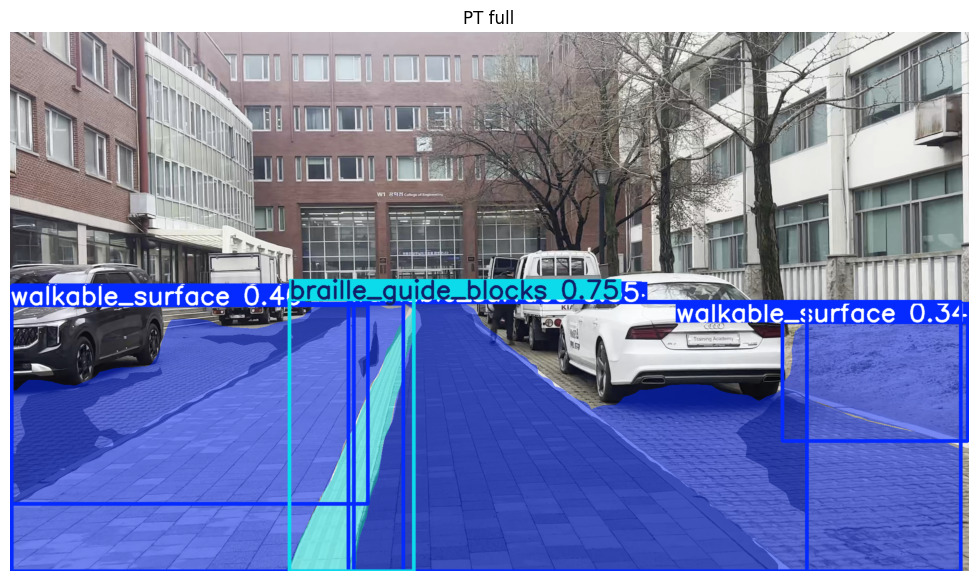

TFLite full
Loading /content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.onnx for ONNX Runtime inference...
Using ONNX Runtime 1.25.1 with CPUExecutionProvider
task: detect
boxes: 7
has masks: False


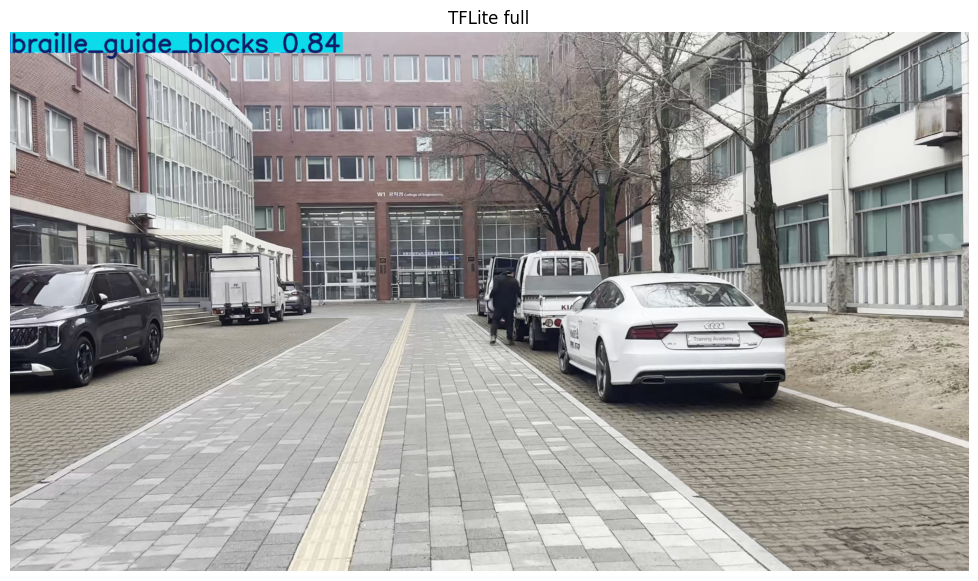

PT crop
task: segment
boxes: 4
has masks: True
mask shape: torch.Size([4, 540, 1920])


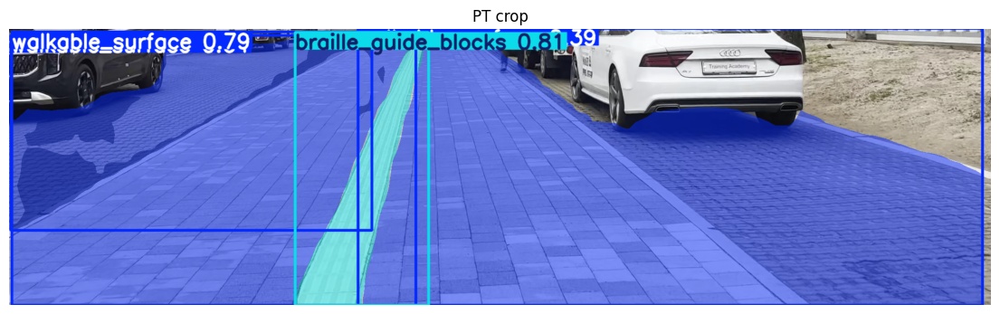

TFLite crop
task: detect
boxes: 4
has masks: False


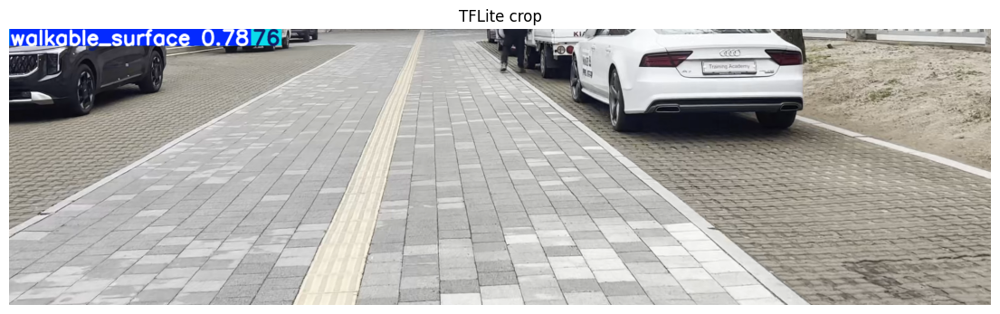

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

PT_MODEL_PATH = "/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.pt"
TFLITE_MODEL_PATH = "/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.onnx"
TEST_IMG = "/content/ffmpeg_frame_공학관.png"

pt_model = YOLO(PT_MODEL_PATH)
tflite_model = YOLO(TFLITE_MODEL_PATH)

tests = [
    ("PT full", pt_model, TEST_IMG, 320),
    ("TFLite full", tflite_model, TEST_IMG, 320),
    ("PT crop", pt_model, crop_path, 320),
    ("TFLite crop", tflite_model, crop_path, 320),
]

for title, m, img_path, size in tests:
    print("=" * 80)
    print(title)

    pred = m.predict(
        source=img_path,
        imgsz=size,
        conf=0.25,
        save=False,
        verbose=False,
        retina_masks=True
    )

    r = pred[0]

    print("task:", m.task)
    print("boxes:", None if r.boxes is None else len(r.boxes))
    print("has masks:", r.masks is not None)

    if r.masks is not None:
        print("mask shape:", r.masks.data.shape)

    plotted = r.plot(
        boxes=True,
        masks=True,
        labels=True,
        conf=True
    )

    plt.figure(figsize=(14, 7))
    plt.imshow(cv2.cvtColor(plotted, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(title)
    plt.show()

In [ ]:
save_dir = "/content/crop_test_runs"

results_full_vis = model.predict(
    source=IMG_PATH,
    imgsz=640,
    save=True,
    project=save_dir,
    name="full",
    exist_ok=True,
    verbose=False
)

results_crop_vis = model.predict(
    source=crop_path,
    imgsz=640,
    save=True,
    project=save_dir,
    name="bottom_half",
    exist_ok=True,
    verbose=False
)

print("saved full result to       :", f"{save_dir}/full")
print("saved bottom-half result to:", f"{save_dir}/bottom_half")

Results saved to /content/crop_test_runs/full
Results saved to /content/crop_test_runs/bottom_half
saved full result to       : /content/crop_test_runs/full
saved bottom-half result to: /content/crop_test_runs/bottom_half


In [ ]:
import os
import glob
import cv2
import matplotlib.pyplot as plt

full_files = glob.glob(f"{save_dir}/full/*")
crop_files = glob.glob(f"{save_dir}/bottom_half/*")

print("full files:", full_files)
print("crop files:", crop_files)

full_result_img = None
crop_result_img = None

for f in full_files:
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".webp")):
        full_result_img = f
        break

for f in crop_files:
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".webp")):
        crop_result_img = f
        break

print("full_result_img:", full_result_img)
print("crop_result_img:", crop_result_img)

full files: ['/content/crop_test_runs/full/ffmpeg_frame_공학관.jpg']
crop files: ['/content/crop_test_runs/bottom_half/test_image_bottom_half.jpg']
full_result_img: /content/crop_test_runs/full/ffmpeg_frame_공학관.jpg
crop_result_img: /content/crop_test_runs/bottom_half/test_image_bottom_half.jpg


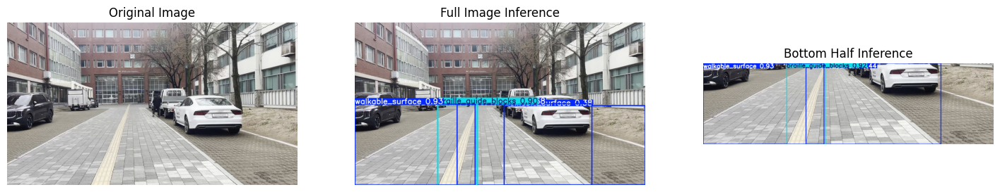

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis("off")

if full_result_img is not None:
    full_img = cv2.imread(full_result_img)
    axes[1].imshow(cv2.cvtColor(full_img, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Full Image Inference")
else:
    axes[1].text(0.5, 0.5, "No full result image", ha="center", va="center")
    axes[1].set_title("Full Image Inference")
axes[1].axis("off")

if crop_result_img is not None:
    crop_img = cv2.imread(crop_result_img)
    axes[2].imshow(cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Bottom Half Inference")
else:
    axes[2].text(0.5, 0.5, "No crop result image", ha="center", va="center")
    axes[2].set_title("Bottom Half Inference")
axes[2].axis("off")

plt.show()

Loading /content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best_saved_model/best_float32.tflite for TensorFlow Lite inference...

image 1/1 /content/test_image.png: 640x640 4 walkable_surfaces, 2 braille_guide_blockss, 174.6ms
Speed: 10.4ms preprocess, 174.6ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/tflite_test_runs/surface_tflite_test
['/content/tflite_test_runs/surface_tflite_test/test_image.jpg']


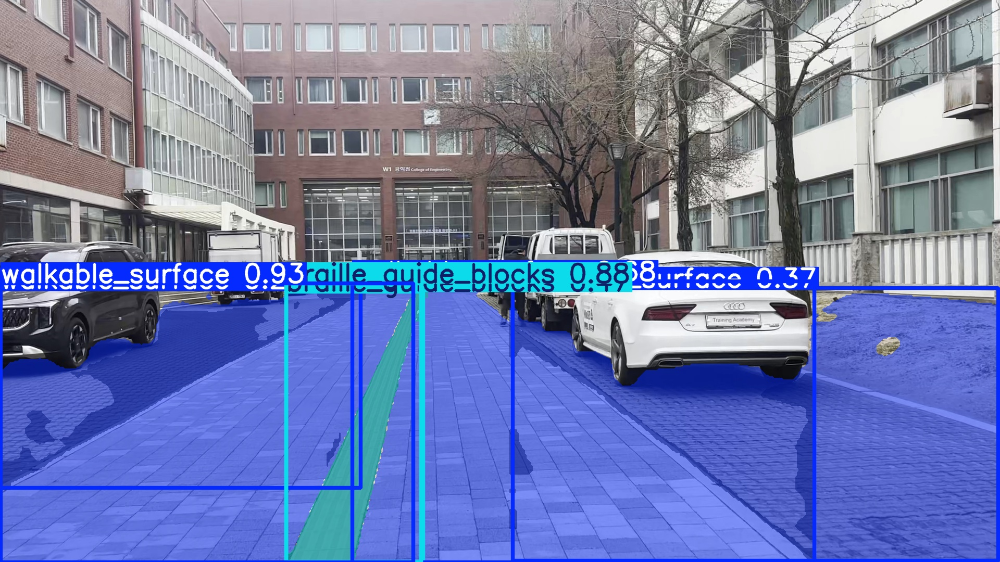

FP16

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.pt")
model.export(format="tflite", imgsz=640, half=True)

INT8

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/yolo_surface_runs/yolo26n_seg_surface_4cls_full/weights/best.pt")
model.export(
    format="tflite",
    imgsz=640,
    int8=True,
    data="/content/drive/MyDrive/aihub_surface_yolo_4cls_full/data.yaml"
)

### surface pseudo-label txt 생성

In [ ]:
import os
import glob
import csv
from pathlib import Path

import numpy as np
from tqdm import tqdm
from ultralytics import YOLO

# =========================
# 경로 설정
# =========================
CAPSTONE_ROOT = "/content/drive/MyDrive/capstone dataset"

# 네가 방금 학습한 surface 모델 best.pt 경로로 바꿔줘
SURFACE_MODEL_PATH = "/content/drive/MyDrive/yolo_surface_runs/yolo26s_seg_surface_4cls_full-2/weights/best.pt"

# pseudo-label 저장 루트
PSEUDO_ROOT = "/content/drive/MyDrive/capstone2026/object_surface_pseudo"
PSEUDO_LABEL_DIR = os.path.join(PSEUDO_ROOT, "labels")

# 로그/매니페스트 저장
MANIFEST_CSV = os.path.join(PSEUDO_ROOT, "pseudo_manifest.csv")

os.makedirs(PSEUDO_LABEL_DIR, exist_ok=True)

# =========================
# 추론 설정
# =========================
IMGSZ = 960          # surface 모델 학습 때 썼던 값과 맞추는 걸 추천
CONF_THRES = 0.50    # 시작점 추천값
IOU_THRES = 0.50
MAX_DET = 50

# 너무 작은 마스크 제거용
MIN_POINTS = 3
MIN_MASK_AREA_RATIO = 0.0005   # 전체 이미지 대비 너무 작은 마스크 제거

# =========================
# surface 클래스 정의
# =========================
SURFACE_CLASS_NAMES = [
    "walkable_surface",
    "braille_guide_blocks",
    "caution_surface",
    "roadway",
]

object 클래스 수 읽기

In [ ]:
import xml.etree.ElementTree as ET

def find_object_sample_dirs(root_dir):
    dirs = []
    for current_dir, subdirs, files in os.walk(root_dir):
        base = os.path.basename(current_dir)
        if base.startswith("Polygon_") or base.startswith("polygon_"):
            xmls = glob.glob(os.path.join(current_dir, "*.xml"))
            if len(xmls) >= 1:
                dirs.append(current_dir)
    return sorted(dirs)


def get_single_xml_path(folder_path):
    xmls = glob.glob(os.path.join(folder_path, "*.xml"))
    if len(xmls) != 1:
        raise ValueError(f"[오류] {folder_path} 에 xml이 1개가 아님: {xmls}")
    return xmls[0]


def parse_object_class_order_from_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    labels = []
    for label_tag in root.findall("./meta/task/labels/label"):
        name_tag = label_tag.find("name")
        if name_tag is not None and name_tag.text:
            labels.append(name_tag.text.strip())
    return labels

object_dirs = find_object_sample_dirs(CAPSTONE_ROOT)
print("num object dirs:", len(object_dirs))
print("sample:", object_dirs[:3])

first_object_xml = get_single_xml_path(object_dirs[0])
OBJECT_CLASS_NAMES = parse_object_class_order_from_xml(first_object_xml)
OBJECT_CLASS_COUNT = len(OBJECT_CLASS_NAMES)

print("OBJECT_CLASS_COUNT:", OBJECT_CLASS_COUNT)
print("OBJECT_CLASS_NAMES:", OBJECT_CLASS_NAMES)

num object dirs: 139
sample: ['/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1203', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1204']
OBJECT_CLASS_COUNT: 29
OBJECT_CLASS_NAMES: ['wheelchair', 'truck', 'tree_trunk', 'traffic_sign', 'traffic_light', 'traffic_light_controller', 'table', 'stroller', 'stop', 'scooter', 'potted_plant', 'power_controller', 'pole', 'person', 'parking_meter', 'movable_signage', 'motorcycle', 'kiosk', 'fire_hydrant', 'dog', 'chair', 'cat', 'carrier', 'car', 'bus', 'bollard', 'bicycle', 'bench', 'barricade']


In [ ]:
FINAL_CLASS_NAMES = OBJECT_CLASS_NAMES + SURFACE_CLASS_NAMES
FINAL_CLASS2ID = {name: i for i, name in enumerate(FINAL_CLASS_NAMES)}

SURFACE_LOCAL2FINAL = {
    0: FINAL_CLASS2ID["walkable_surface"],
    1: FINAL_CLASS2ID["braille_guide_blocks"],
    2: FINAL_CLASS2ID["caution_surface"],
    3: FINAL_CLASS2ID["roadway"],
}

print("surface class -> final class id")
for k, v in SURFACE_LOCAL2FINAL.items():
    print(k, "->", v, FINAL_CLASS_NAMES[v])

surface class -> final class id
0 -> 29 walkable_surface
1 -> 30 braille_guide_blocks
2 -> 31 caution_surface
3 -> 32 roadway


In [ ]:
def find_image_files(folder_path):
    exts = ["*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"]
    imgs = []
    for ext in exts:
        imgs.extend(glob.glob(os.path.join(folder_path, ext)))
    return sorted(imgs)

object_images = []
for d in object_dirs:
    imgs = find_image_files(d)
    for p in imgs:
        object_images.append(p)

print("num object images:", len(object_images))
print("sample images:", object_images[:5])

num object images: 6950
sample images: ['/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202/ZED3_KSC_085848_L_P025951.png', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202/ZED3_KSC_085851_L_P025952.png', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202/ZED3_KSC_085854_L_P025953.png', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202/ZED3_KSC_085855_L_P025954.png', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202/ZED3_KSC_085856_L_P025955.png']


In [ ]:
def polygon_area_xy_norm(points_xy_norm):
    """
    points_xy_norm: Nx2, normalized [0,1]
    shoelace formula
    """
    if len(points_xy_norm) < 3:
        return 0.0
    x = points_xy_norm[:, 0]
    y = points_xy_norm[:, 1]
    return 0.5 * abs(np.dot(x, np.roll(y, -1)) - np.dot(y, np.roll(x, -1)))


def seg_to_yolo_line(class_id, pts_xy_norm):
    vals = []
    for x, y in pts_xy_norm:
        vals.append(f"{float(x):.6f}")
        vals.append(f"{float(y):.6f}")
    return f"{class_id} " + " ".join(vals)

In [ ]:
surface_model = YOLO(SURFACE_MODEL_PATH)
print("loaded:", SURFACE_MODEL_PATH)

loaded: /content/drive/MyDrive/yolo_surface_runs/yolo26s_seg_surface_4cls_full-2/weights/best.pt


pseudo-label 생성

In [ ]:
def image_to_pseudo_txt_name(img_path):
    """
    object GT 쪽과 맞추기 쉽게 stem.txt 로 저장
    필요하면 group prefix 붙이도록 바꿔도 됨.
    """
    stem = Path(img_path).stem
    return f"{stem}.txt"

rows = []

for img_path in tqdm(object_images, desc="Generating surface pseudo labels"):
    txt_name = image_to_pseudo_txt_name(img_path)
    txt_path = os.path.join(PSEUDO_LABEL_DIR, txt_name)

    results = surface_model.predict(
        source=img_path,
        imgsz=IMGSZ,
        conf=CONF_THRES,
        iou=IOU_THRES,
        max_det=MAX_DET,
        save=False,
        verbose=False,
        retina_masks=True,
    )

    r = results[0]

    lines = []
    n_raw = 0
    n_kept = 0

    if r.masks is not None and r.boxes is not None:
        # masks.xyn: 각 인스턴스 polygon normalized coordinates
        masks_xyn = r.masks.xyn
        cls_ids = r.boxes.cls.cpu().numpy().astype(int)
        confs = r.boxes.conf.cpu().numpy()

        for seg, cls_id, conf in zip(masks_xyn, cls_ids, confs):
            n_raw += 1

            if cls_id not in SURFACE_LOCAL2FINAL:
                continue

            pts = np.array(seg, dtype=float)

            if len(pts) < MIN_POINTS:
                continue

            area_ratio = polygon_area_xy_norm(pts)
            if area_ratio < MIN_MASK_AREA_RATIO:
                continue

            final_cls_id = SURFACE_LOCAL2FINAL[cls_id]
            line = seg_to_yolo_line(final_cls_id, pts)
            lines.append(line)
            n_kept += 1

    with open(txt_path, "w", encoding="utf-8") as f:
        f.write("\n".join(lines))

    rows.append({
        "img_path": img_path,
        "txt_path": txt_path,
        "n_raw_preds": n_raw,
        "n_kept_preds": n_kept,
    })

with open(MANIFEST_CSV, "w", newline="", encoding="utf-8-sig") as f:
    writer = csv.DictWriter(f, fieldnames=["img_path", "txt_path", "n_raw_preds", "n_kept_preds"])
    writer.writeheader()
    writer.writerows(rows)

print("saved pseudo labels to:", PSEUDO_LABEL_DIR)
print("saved manifest:", MANIFEST_CSV)

Generating surface pseudo labels: 100%|██████████| 6950/6950 [2:06:56<00:00,  1.10s/it]

saved pseudo labels to: /content/drive/MyDrive/capstone2026/object_surface_pseudo/labels
saved manifest: /content/drive/MyDrive/capstone2026/object_surface_pseudo/pseudo_manifest.csv


In [ ]:
import pandas as pd

manifest_df = pd.read_csv(MANIFEST_CSV)
print(manifest_df.head())
print("num images:", len(manifest_df))
print("avg raw preds :", manifest_df["n_raw_preds"].mean())
print("avg kept preds:", manifest_df["n_kept_preds"].mean())
print("images with >=1 pseudo:", (manifest_df["n_kept_preds"] > 0).sum())

                                            img_path  \
0  /content/drive/MyDrive/capstone dataset/객체ᄑ...   
1  /content/drive/MyDrive/capstone dataset/객체ᄑ...   
2  /content/drive/MyDrive/capstone dataset/객체ᄑ...   
3  /content/drive/MyDrive/capstone dataset/객체ᄑ...   
4  /content/drive/MyDrive/capstone dataset/객체ᄑ...   

                                            txt_path  n_raw_preds  \
0  /content/drive/MyDrive/capstone2026/object_sur...            0   
1  /content/drive/MyDrive/capstone2026/object_sur...            0   
2  /content/drive/MyDrive/capstone2026/object_sur...            0   
3  /content/drive/MyDrive/capstone2026/object_sur...            0   
4  /content/drive/MyDrive/capstone2026/object_sur...            0   

   n_kept_preds  
0             0  
1             0  
2             0  
3             0  
4             0  
num images: 6950
avg raw preds : 1.9679136690647483
avg kept preds: 1.9447482014388489
images with >=1 pseudo: 5222


In [ ]:
sample_txts = sorted(glob.glob(os.path.join(PSEUDO_LABEL_DIR, "*.txt")))[:5]
for p in sample_txts:
    print("=" * 80)
    print(p)
    with open(p, "r", encoding="utf-8") as f:
        print(f.read()[:1000])

/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100133_L_P029772.txt

/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100146_L_P029773.txt

/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100147_L_P029774.txt

/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100148_L_P029775.txt

/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100149_L_P029776.txt



### object polygon XML을 YOLO용 txt로 변환

In [ ]:
import os
import glob
import shutil
import random
import xml.etree.ElementTree as ET
from pathlib import Path
from tqdm import tqdm

CAPSTONE_ROOT = "/content/drive/MyDrive/capstone dataset"
OUT_ROOT = "/content/drive/MyDrive/capstone2026/object_yolo_seg"

SEED = 42
TRAIN_RATIO = 0.8
VAL_RATIO = 0.1
TEST_RATIO = 0.1

assert abs(TRAIN_RATIO + VAL_RATIO + TEST_RATIO - 1.0) < 1e-6

random.seed(SEED)

In [ ]:
for d in [
    f"{OUT_ROOT}/images/train",
    f"{OUT_ROOT}/images/val",
    f"{OUT_ROOT}/images/test",
    f"{OUT_ROOT}/labels/train",
    f"{OUT_ROOT}/labels/val",
    f"{OUT_ROOT}/labels/test",
]:
    os.makedirs(d, exist_ok=True)

In [ ]:
def find_object_sample_dirs(root_dir):
    dirs = []

    for current_dir, subdirs, files in os.walk(root_dir):
        base = os.path.basename(current_dir)
        if base.startswith("Polygon_") or base.startswith("polygon_"):
            xmls = glob.glob(os.path.join(current_dir, "*.xml"))
            if len(xmls) >= 1:
                dirs.append(current_dir)

    return sorted(dirs)

def get_single_xml_path(folder_path):
    xmls = glob.glob(os.path.join(folder_path, "*.xml"))
    if len(xmls) != 1:
        raise ValueError(f"[오류] {folder_path} 에 xml이 1개가 아님: {xmls}")
    return xmls[0]

def find_image_files(folder_path):
    exts = ["*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"]
    imgs = []
    for ext in exts:
        imgs.extend(glob.glob(os.path.join(folder_path, ext)))
    return sorted(imgs)

object_dirs = find_object_sample_dirs(CAPSTONE_ROOT)
print("num object dirs:", len(object_dirs))
print("sample dirs:", object_dirs[:5])

num object dirs: 139
sample dirs: ['/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1203', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1204', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1205', '/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1206']


첫 xml에서 클래스 순서 읽기

In [ ]:
def parse_object_class_order_from_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    labels = []
    for label_tag in root.findall("./meta/task/labels/label"):
        name_tag = label_tag.find("name")
        if name_tag is not None and name_tag.text:
            labels.append(name_tag.text.strip())
    return labels

first_object_xml = get_single_xml_path(object_dirs[0])
OBJECT_CLASS_NAMES = parse_object_class_order_from_xml(first_object_xml)
OBJECT_CLASS2ID = {c: i for i, c in enumerate(OBJECT_CLASS_NAMES)}

print("num object classes:", len(OBJECT_CLASS_NAMES))
print(OBJECT_CLASS_NAMES)

num object classes: 29
['wheelchair', 'truck', 'tree_trunk', 'traffic_sign', 'traffic_light', 'traffic_light_controller', 'table', 'stroller', 'stop', 'scooter', 'potted_plant', 'power_controller', 'pole', 'person', 'parking_meter', 'movable_signage', 'motorcycle', 'kiosk', 'fire_hydrant', 'dog', 'chair', 'cat', 'carrier', 'car', 'bus', 'bollard', 'bicycle', 'bench', 'barricade']


polygon -> yolo-seg 변환 유틸

In [ ]:
def parse_points(points_str):
    pts = []
    for p in points_str.split(";"):
        p = p.strip()
        if not p:
            continue
        x, y = p.split(",")
        pts.append((float(x), float(y)))
    return pts

def clip_value(v, low, high):
    return max(low, min(float(v), high))

def normalize_and_clip_points(pts, w, h):
    new_pts = []
    for x, y in pts:
        x = clip_value(x, 0, w)
        y = clip_value(y, 0, h)
        new_pts.append((x, y))
    return new_pts

def polygon_to_yolo_line(class_id, pts, w, h):
    vals = []
    for x, y in pts:
        vals.append(f"{x / w:.6f}")
        vals.append(f"{y / h:.6f}")
    return f"{class_id} " + " ".join(vals)

xml 하나 읽어서 이미지별 annotation

In [ ]:
def collect_object_annotations_from_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    result = {}

    for image_tag in root.findall("image"):
        img_name = os.path.basename(image_tag.attrib["name"])
        w = int(float(image_tag.attrib["width"]))
        h = int(float(image_tag.attrib["height"]))

        lines = []

        for poly in image_tag.findall("polygon"):
            label = poly.attrib["label"].strip()
            points_str = poly.attrib["points"]

            if label not in OBJECT_CLASS2ID:
                continue

            pts = parse_points(points_str)
            pts = normalize_and_clip_points(pts, w, h)

            if len(pts) < 3:
                continue

            class_id = OBJECT_CLASS2ID[label]
            line = polygon_to_yolo_line(class_id, pts, w, h)
            lines.append(line)

        result[img_name] = lines

    return result

In [ ]:
random.shuffle(object_dirs)

n_total = len(object_dirs)
n_train = int(n_total * TRAIN_RATIO)
n_val = int(n_total * VAL_RATIO)
n_test = n_total - n_train - n_val

train_dirs = object_dirs[:n_train]
val_dirs = object_dirs[n_train:n_train + n_val]
test_dirs = object_dirs[n_train + n_val:]

print("total dirs :", n_total)
print("train dirs :", len(train_dirs))
print("val dirs   :", len(val_dirs))
print("test dirs  :", len(test_dirs))

total dirs : 139
train dirs : 111
val dirs   : 13
test dirs  : 15


In [ ]:
def process_object_split(object_dir_list, split_name):
    img_out = f"{OUT_ROOT}/images/{split_name}"
    lab_out = f"{OUT_ROOT}/labels/{split_name}"

    total_imgs = 0
    xml_cache = {}

    for odir in tqdm(object_dir_list, desc=f"Processing {split_name}"):
        xmls = glob.glob(os.path.join(odir, "*.xml"))
        if len(xmls) != 1:
            print(f"[SKIP] xml 개수 이상함: {odir} -> {xmls}")
            continue

        xml_path = xmls[0]

        if xml_path not in xml_cache:
            xml_cache[xml_path] = collect_object_annotations_from_xml(xml_path)

        ann_dict = xml_cache[xml_path]

        img_files = find_image_files(odir)

        for img_path in img_files:
            img_name = os.path.basename(img_path)
            txt_name = os.path.splitext(img_name)[0] + ".txt"
            lines = ann_dict.get(img_name, [])

            shutil.copy(img_path, os.path.join(img_out, img_name))

            with open(os.path.join(lab_out, txt_name), "w", encoding="utf-8") as f:
                f.write("\n".join(lines))

            total_imgs += 1

    print(f"{split_name} images:", total_imgs)

In [ ]:
process_object_split(train_dirs, "train")
process_object_split(val_dirs, "val")
process_object_split(test_dirs, "test")

print("object conversion done")

Processing train: 100%|██████████| 111/111 [04:19<00:00,  2.34s/it]


train images: 5550


Processing val: 100%|██████████| 13/13 [00:32<00:00,  2.54s/it]


val images: 650


Processing test: 100%|██████████| 15/15 [00:38<00:00,  2.59s/it]

test images: 750
object conversion done


data.yaml 생성

In [ ]:
yaml_text = f"""path: {OUT_ROOT}
train: images/train
val: images/val
test: images/test

names:
"""
for i, name in enumerate(OBJECT_CLASS_NAMES):
    yaml_text += f"  {i}: {name}\n"

yaml_path = f"{OUT_ROOT}/data.yaml"

with open(yaml_path, "w", encoding="utf-8") as f:
    f.write(yaml_text)

print("saved data.yaml")
print(open(yaml_path, "r", encoding="utf-8").read()[:3000])

saved data.yaml
path: /content/drive/MyDrive/capstone2026/object_yolo_seg
train: images/train
val: images/val
test: images/test

names:
  0: wheelchair
  1: truck
  2: tree_trunk
  3: traffic_sign
  4: traffic_light
  5: traffic_light_controller
  6: table
  7: stroller
  8: stop
  9: scooter
  10: potted_plant
  11: power_controller
  12: pole
  13: person
  14: parking_meter
  15: movable_signage
  16: motorcycle
  17: kiosk
  18: fire_hydrant
  19: dog
  20: chair
  21: cat
  22: carrier
  23: car
  24: bus
  25: bollard
  26: bicycle
  27: bench
  28: barricade



In [ ]:
print("train images:", len(glob.glob(f"{OUT_ROOT}/images/train/*")))
print("val images  :", len(glob.glob(f"{OUT_ROOT}/images/val/*")))
print("test images :", len(glob.glob(f"{OUT_ROOT}/images/test/*")))

print("train labels:", len(glob.glob(f"{OUT_ROOT}/labels/train/*")))
print("val labels  :", len(glob.glob(f"{OUT_ROOT}/labels/val/*")))
print("test labels :", len(glob.glob(f"{OUT_ROOT}/labels/test/*")))

train images: 5550
val images  : 650
test images : 750
train labels: 5550
val labels  : 650
test labels : 750


In [ ]:
sample_txts = sorted(glob.glob(f"{OUT_ROOT}/labels/train/*.txt"))[:5]

for p in sample_txts:
    print("=" * 80)
    print(p)
    with open(p, "r", encoding="utf-8") as f:
        print(f.read()[:1200])

/content/drive/MyDrive/capstone2026/object_yolo_seg/labels/train/ZED1_KSC_100133_L_P029772.txt
23 0.478453 0.299194 0.483323 0.292213 0.484089 0.288259 0.489047 0.286435 0.502026 0.285981 0.510568 0.289176 0.516375 0.294333 0.524229 0.301620 0.530125 0.303750 0.534995 0.306481 0.536870 0.309065 0.535333 0.324852 0.530979 0.326676 0.528844 0.331231 0.525344 0.331537 0.523036 0.329713 0.520646 0.325917 0.512531 0.324852 0.513469 0.305870 0.510906 0.305417 0.510568 0.324250 0.494766 0.323185 0.489531 0.326944 0.490208 0.303241 0.488437 0.303241 0.487339 0.326981 0.485286 0.326519 0.482641 0.319843 0.476917 0.318176 0.477516 0.305870
2 0.086474 0.431389 0.097099 0.432963 0.111094 0.425722 0.103229 0.248981 0.100094 0.136352 0.094729 0.046593 0.089948 0.000000 0.076135 0.000000 0.083906 0.223611 0.087307 0.349972
/content/drive/MyDrive/capstone2026/object_yolo_seg/labels/train/ZED1_KSC_100146_L_P029773.txt
11 0.884276 0.269657 0.867807 0.270602 0.856156 0.441685 0.871651 0.449333 0.873349 0

### object GT txt + surface pseudo txt 병합

In [ ]:
import os
import glob
import shutil
from pathlib import Path
from tqdm import tqdm
import pandas as pd

# =========================
# 경로 설정
# =========================

# object 이미지 루트 (이미지 복사/링크용)
CAPSTONE_ROOT = "/content/drive/MyDrive/capstone dataset"

# object GT txt가 있는 위치
# 네 object YOLO GT를 만들었던 최종 폴더로 바꿔줘
OBJECT_GT_ROOT = "/content/drive/MyDrive/capstone2026/object_yolo_seg"

# surface pseudo txt 폴더
SURFACE_PSEUDO_LABEL_DIR = "/content/drive/MyDrive/capstone2026/object_surface_pseudolabels"


# 병합된 통합 데이터셋 저장 위치
MERGED_ROOT = "/content/drive/MyDrive/capstone2026/merged_object_surface_single"

# 최종 출력 폴더
for d in [
    f"{MERGED_ROOT}/images/train",
    f"{MERGED_ROOT}/images/val",
    f"{MERGED_ROOT}/images/test",
    f"{MERGED_ROOT}/labels/train",
    f"{MERGED_ROOT}/labels/val",
    f"{MERGED_ROOT}/labels/test",
]:
    os.makedirs(d, exist_ok=True)

In [ ]:
def find_files(folder, exts):
    files = []
    for ext in exts:
        files.extend(glob.glob(os.path.join(folder, ext)))
    return sorted(files)

def read_txt_lines(txt_path):
    if not os.path.exists(txt_path):
        return []
    with open(txt_path, "r", encoding="utf-8") as f:
        return [x.strip() for x in f.readlines() if x.strip()]

def write_txt_lines(txt_path, lines):
    with open(txt_path, "w", encoding="utf-8") as f:
        f.write("\n".join(lines))

def safe_copy(src, dst):
    os.makedirs(os.path.dirname(dst), exist_ok=True)
    if not os.path.exists(dst):
        shutil.copy2(src, dst)


def build_stem_to_pseudo_map(pseudo_dir):
    pseudo_map = {}
    pseudo_files = sorted(glob.glob(os.path.join(pseudo_dir, "*.txt")))
    for p in pseudo_files:
        stem = Path(p).stem
        if stem not in pseudo_map:
            pseudo_map[stem] = p
    return pseudo_map

In [ ]:
pseudo_map = build_stem_to_pseudo_map(SURFACE_PSEUDO_LABEL_DIR)
print("num pseudo txt:", len(pseudo_map))
print("sample:", list(pseudo_map.items())[:5])

num pseudo txt: 0
sample: []


spilt별 병합 함수

In [ ]:
def merge_split(split_name):
    img_dir = os.path.join(OBJECT_GT_ROOT, "images", split_name)
    lab_dir = os.path.join(OBJECT_GT_ROOT, "labels", split_name)

    out_img_dir = os.path.join(MERGED_ROOT, "images", split_name)
    out_lab_dir = os.path.join(MERGED_ROOT, "labels", split_name)

    img_files = find_files(img_dir, ["*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"])

    rows = []

    for img_path in tqdm(img_files, desc=f"Merging {split_name}"):
        stem = Path(img_path).stem
        ext = Path(img_path).suffix

        obj_gt_txt = os.path.join(lab_dir, f"{stem}.txt")
        pseudo_txt = pseudo_map.get(stem, None)

        object_lines = read_txt_lines(obj_gt_txt)
        pseudo_lines = read_txt_lines(pseudo_txt) if pseudo_txt is not None else []

        merged_lines = []
        merged_lines.extend(object_lines)
        merged_lines.extend(pseudo_lines)

        out_img_path = os.path.join(out_img_dir, f"{stem}{ext}")
        out_lab_path = os.path.join(out_lab_dir, f"{stem}.txt")

        safe_copy(img_path, out_img_path)
        write_txt_lines(out_lab_path, merged_lines)

        rows.append({
            "split": split_name,
            "img_path": img_path,
            "object_gt_txt": obj_gt_txt,
            "surface_pseudo_txt": pseudo_txt if pseudo_txt is not None else "",
            "n_object_lines": len(object_lines),
            "n_surface_pseudo_lines": len(pseudo_lines),
            "n_merged_lines": len(merged_lines),
        })

    return pd.DataFrame(rows)

실제 병합

In [ ]:
train_df = merge_split("train")
val_df   = merge_split("val")
test_df  = merge_split("test")

merged_manifest = pd.concat([train_df, val_df, test_df], ignore_index=True)
manifest_path = os.path.join(MERGED_ROOT, "merged_manifest.csv")
merged_manifest.to_csv(manifest_path, index=False, encoding="utf-8-sig")

print("saved merged manifest:", manifest_path)
print(merged_manifest.head())

Merging test: 100%|██████████| 750/750 [00:41<00:00, 18.05it/s]


saved merged manifest: /content/drive/MyDrive/capstone2026/merged_object_surface_single/merged_manifest.csv
   split                                           img_path  \
0  train  /content/drive/MyDrive/capstone2026/object_yol...   
1  train  /content/drive/MyDrive/capstone2026/object_yol...   
2  train  /content/drive/MyDrive/capstone2026/object_yol...   
3  train  /content/drive/MyDrive/capstone2026/object_yol...   
4  train  /content/drive/MyDrive/capstone2026/object_yol...   

                                       object_gt_txt surface_pseudo_txt  \
0  /content/drive/MyDrive/capstone2026/object_yol...                      
1  /content/drive/MyDrive/capstone2026/object_yol...                      
2  /content/drive/MyDrive/capstone2026/object_yol...                      
3  /content/drive/MyDrive/capstone2026/object_yol...                      
4  /content/drive/MyDrive/capstone2026/object_yol...                      

   n_object_lines  n_surface_pseudo_lines  n_merged_lines  
0 

In [ ]:
print("train images:", len(glob.glob(f"{MERGED_ROOT}/images/train/*")))
print("val images  :", len(glob.glob(f"{MERGED_ROOT}/images/val/*")))
print("test images :", len(glob.glob(f"{MERGED_ROOT}/images/test/*")))

print("train labels:", len(glob.glob(f"{MERGED_ROOT}/labels/train/*")))
print("val labels  :", len(glob.glob(f"{MERGED_ROOT}/labels/val/*")))
print("test labels :", len(glob.glob(f"{MERGED_ROOT}/labels/test/*")))
print("avg object lines       :", merged_manifest["n_object_lines"].mean())
print("avg surface pseudo     :", merged_manifest["n_surface_pseudo_lines"].mean())
print("avg merged lines       :", merged_manifest["n_merged_lines"].mean())
print("has pseudo >=1 images  :", (merged_manifest["n_surface_pseudo_lines"] > 0).sum())

train images: 5550
val images  : 650
test images : 750
train labels: 5550
val labels  : 650
test labels : 750
avg object lines       : 7.452517985611511
avg surface pseudo     : 0.0
avg merged lines       : 7.452517985611511
has pseudo >=1 images  : 0


In [ ]:
sample_txts = sorted(glob.glob(os.path.join(MERGED_ROOT, "labels", "train", "*.txt")))[:5]

for p in sample_txts:
    print("=" * 80)
    print(p)
    with open(p, "r", encoding="utf-8") as f:
        print(f.read()[:1500])

/content/drive/MyDrive/capstone2026/merged_object_surface_single/labels/train/ZED1_KSC_100133_L_P029772.txt
23 0.478453 0.299194 0.483323 0.292213 0.484089 0.288259 0.489047 0.286435 0.502026 0.285981 0.510568 0.289176 0.516375 0.294333 0.524229 0.301620 0.530125 0.303750 0.534995 0.306481 0.536870 0.309065 0.535333 0.324852 0.530979 0.326676 0.528844 0.331231 0.525344 0.331537 0.523036 0.329713 0.520646 0.325917 0.512531 0.324852 0.513469 0.305870 0.510906 0.305417 0.510568 0.324250 0.494766 0.323185 0.489531 0.326944 0.490208 0.303241 0.488437 0.303241 0.487339 0.326981 0.485286 0.326519 0.482641 0.319843 0.476917 0.318176 0.477516 0.305870
2 0.086474 0.431389 0.097099 0.432963 0.111094 0.425722 0.103229 0.248981 0.100094 0.136352 0.094729 0.046593 0.089948 0.000000 0.076135 0.000000 0.083906 0.223611 0.087307 0.349972
/content/drive/MyDrive/capstone2026/merged_object_surface_single/labels/train/ZED1_KSC_100146_L_P029773.txt
11 0.884276 0.269657 0.867807 0.270602 0.856156 0.441685 0.

data yaml만들기

In [ ]:
OBJECT_CLASS_NAMES = [
    "wheelchair", "truck", "tree_trunk", "traffic_sign", "traffic_light",
    "traffic_light_controller", "table", "stroller", "stop", "scooter",
    "potted_plant", "power_controller", "pole", "person", "parking_meter",
    "movable_signage", "motorcycle", "kiosk", "fire_hydrant", "dog",
    "chair", "cat", "carrier", "car", "bus", "bollard", "bicycle",
    "bench", "barricade"
]

SURFACE_CLASS_NAMES = [
    "walkable_surface",
    "braille_guide_blocks",
    "caution_surface",
    "roadway"
]

FINAL_CLASS_NAMES = OBJECT_CLASS_NAMES + SURFACE_CLASS_NAMES

In [ ]:
yaml_text = f"""path: {MERGED_ROOT}
train: images/train
val: images/val
test: images/test

names:
"""
for i, name in enumerate(FINAL_CLASS_NAMES):
    yaml_text += f"  {i}: {name}\n"

yaml_path = os.path.join(MERGED_ROOT, "data.yaml")
with open(yaml_path, "w", encoding="utf-8") as f:
    f.write(yaml_text)

print("saved:", yaml_path)
print(open(yaml_path, "r", encoding="utf-8").read()[:3000])

saved: /content/drive/MyDrive/capstone2026/merged_object_surface_single/data.yaml
path: /content/drive/MyDrive/capstone2026/merged_object_surface_single
train: images/train
val: images/val
test: images/test

names:
  0: wheelchair
  1: truck
  2: tree_trunk
  3: traffic_sign
  4: traffic_light
  5: traffic_light_controller
  6: table
  7: stroller
  8: stop
  9: scooter
  10: potted_plant
  11: power_controller
  12: pole
  13: person
  14: parking_meter
  15: movable_signage
  16: motorcycle
  17: kiosk
  18: fire_hydrant
  19: dog
  20: chair
  21: cat
  22: carrier
  23: car
  24: bus
  25: bollard
  26: bicycle
  27: bench
  28: barricade
  29: walkable_surface
  30: braille_guide_blocks
  31: caution_surface
  32: roadway



단일 통합 모델 함수

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo26s-seg.pt")  # 엣지 목표면 n 먼저 추천

model.train(
    data=os.path.join(MERGED_ROOT, "data.yaml"),
    epochs=80,
    imgsz=640,
    batch=8,
    device=0,
    cache=True,
    patience=15,
    project="/content/drive/MyDrive/yolo_merged_runs",
    name="yolo26n_seg_object_surface_merged"
)

Ultralytics 8.4.41 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/capstone2026/merged_object_surface_single/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26s-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo26n_seg_object_surface_merged, nbs=64, nm

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 18, 20, 22, 23, 24, 25, 26, 27, 28])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a698ad00830>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.03

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 22.4 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

BEST_MODEL_PATH = "/content/drive/MyDrive/yolo_merged_runs/yolo26n_seg_object_surface_merged/weights/best.pt"
TEST_IMG = "/content/ffmpeg_frame_공학관.png"

model = YOLO(BEST_MODEL_PATH)

for size in [640, 960]:
    print("=" * 60)
    print("Predict imgsz =", size)

    model.predict(
        source=TEST_IMG,
        imgsz=size,
        conf=0.25,
        iou=0.5,
        save=True,
        project="/content/drive/MyDrive/yolo_merged_runs",
        name=f"merged_model_predict_{size}",
        exist_ok=True,
        retina_masks=True
    )

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Predict imgsz = 640

image 1/1 /content/ffmpeg_frame_공학관.png: 384x640 2 trucks, 1 tree_trunk, 2 cars, 101.8ms
Speed: 12.6ms preprocess, 101.8ms inference, 67.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/drive/MyDrive/yolo_merged_runs/merged_model_predict_640
Predict imgsz = 960

image 1/1 /content/ffmpeg_frame_공학관.png: 544x960 2 trucks, 1 tree_trunk, 1 person, 3 cars, 101.5ms
Speed: 3.3ms preprocess, 101.5ms inference, 1.8ms postprocess per image at shape (1, 3, 544, 960)
Results saved to /content/drive/MyDrive/yolo_merged_runs/merged_model_predict_960


In [ ]:
import os
import glob
from pathlib import Path

SURFACE_PSEUDO_LABEL_DIR = "/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels"

pseudo_txts = sorted(glob.glob(os.path.join(SURFACE_PSEUDO_LABEL_DIR, "*.txt")))
print("num pseudo txt:", len(pseudo_txts))
print("sample paths:", pseudo_txts[:5])

print("\n=== sample contents ===")
for p in pseudo_txts[:5]:
    print("=" * 80)
    print("path:", p)
    with open(p, "r", encoding="utf-8") as f:
        print(repr(f.read()[:500]))

print("\n=== sample stems ===")
print([Path(x).stem for x in pseudo_txts[:10]])

num pseudo txt: 6950
sample paths: ['/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100133_L_P029772.txt', '/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100146_L_P029773.txt', '/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100147_L_P029774.txt', '/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100148_L_P029775.txt', '/content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100149_L_P029776.txt']

=== sample contents ===
path: /content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100133_L_P029772.txt
''
path: /content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100146_L_P029773.txt
''
path: /content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100147_L_P029774.txt
''
path: /content/drive/MyDrive/capstone2026/object_surface_pseudo/labels/ZED1_KSC_100148_L_P029775.txt
''
path: /content/drive/MyDrive/caps

In [ ]:
import os
import glob
from pathlib import Path

OBJECT_GT_ROOT = "/content/drive/MyDrive/capstone2026/object_yolo_seg"

obj_txts = sorted(glob.glob(os.path.join(OBJECT_GT_ROOT, "labels", "train", "*.txt")))
print("num object txt:", len(obj_txts))
print("sample object stems:", [Path(x).stem for x in obj_txts[:10]])

pseudo_txts = sorted(glob.glob(os.path.join(SURFACE_PSEUDO_LABEL_DIR, "*.txt")))
print("sample pseudo stems:", [Path(x).stem for x in pseudo_txts[:10]])

obj_stems = set(Path(x).stem for x in obj_txts)
pseudo_stems = set(Path(x).stem for x in pseudo_txts)

inter = obj_stems & pseudo_stems
print("intersection count:", len(inter))
print("sample intersection:", list(sorted(inter))[:20])

num object txt: 5550
sample object stems: ['ZED1_KSC_100133_L_P029772', 'ZED1_KSC_100146_L_P029773', 'ZED1_KSC_100147_L_P029774', 'ZED1_KSC_100148_L_P029775', 'ZED1_KSC_100149_L_P029776', 'ZED1_KSC_100150_L_P029777', 'ZED1_KSC_100151_L_P029778', 'ZED1_KSC_100153_L_P029779', 'ZED1_KSC_100154_L_P029780', 'ZED1_KSC_100155_L_P029781']
sample pseudo stems: ['ZED1_KSC_100133_L_P029772', 'ZED1_KSC_100146_L_P029773', 'ZED1_KSC_100147_L_P029774', 'ZED1_KSC_100148_L_P029775', 'ZED1_KSC_100149_L_P029776', 'ZED1_KSC_100150_L_P029777', 'ZED1_KSC_100151_L_P029778', 'ZED1_KSC_100153_L_P029779', 'ZED1_KSC_100154_L_P029780', 'ZED1_KSC_100155_L_P029781']
intersection count: 5550
sample intersection: ['ZED1_KSC_100133_L_P029772', 'ZED1_KSC_100146_L_P029773', 'ZED1_KSC_100147_L_P029774', 'ZED1_KSC_100148_L_P029775', 'ZED1_KSC_100149_L_P029776', 'ZED1_KSC_100150_L_P029777', 'ZED1_KSC_100151_L_P029778', 'ZED1_KSC_100153_L_P029779', 'ZED1_KSC_100154_L_P029780', 'ZED1_KSC_100155_L_P029781', 'ZED1_KSC_100157_L

In [ ]:
from ultralytics import YOLO

SURFACE_MODEL_PATH = "/content/drive/MyDrive/yolo_surface_runs/yolo26s_seg_surface_4cls_full-2/weights/best.pt"
TEST_IMG = "/content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202/ZED3_KSC_085848_L_P025951.png"  # 예시, 실제 경로로 바꿔

surface_model = YOLO(SURFACE_MODEL_PATH)

results = surface_model.predict(
    source=TEST_IMG,
    imgsz=960,
    conf=0.10,
    iou=0.5,
    max_det=100,
    save=True,
    project="/content/debug_surface_on_object",
    name="one_image_test",
    exist_ok=True,
    retina_masks=True,
    verbose=False,
)

r = results[0]

print("image:", TEST_IMG)

if r.boxes is None:
    print("boxes: None")
else:
    cls_ids = r.boxes.cls.cpu().numpy().astype(int)
    confs = r.boxes.conf.cpu().numpy()

    print("num preds:", len(cls_ids))
    for cls_id, conf in zip(cls_ids, confs):
        print("cls:", cls_id, "conf:", float(conf))

Results saved to /content/debug_surface_on_object/one_image_test
image: /content/drive/MyDrive/capstone dataset/객체폴리곤_1/Polygon_1202/ZED3_KSC_085848_L_P025951.png
num preds: 2
cls: 0 conf: 0.2961946129798889
cls: 0 conf: 0.27919670939445496


yolo 11 객체 탐지 tflite

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 22.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")
export_path = model.export(format="tflite", imgsz=640)
print(export_path)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.41 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11s summary (fused): 100 layers, 9,419,379 parameters, 0 gradients, 21.3 GFLOPs

PyTorch: starting from '/content/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 21, 8400) (18.3 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'ai-edge-litert>=1.2.0', 'onnx>=1.12.0,<2.0.0', 'onnx2tf>=1.26.3,<1.29.0', 'onnxslim>=0.1.71', 'onnxruntime'] not found, attempting AutoUpdate...
Using Python 3.12

In [ ]:
!zip -r /content/best_saved_model.zip /content/best_saved_model

  adding: content/best_saved_model/ (stored 0%)
  adding: content/best_saved_model/saved_model.pb (deflated 8%)
  adding: content/best_saved_model/variables/ (stored 0%)
  adding: content/best_saved_model/variables/variables.index (deflated 25%)
  adding: content/best_saved_model/variables/variables.data-00000-of-00001 (deflated 44%)
  adding: content/best_saved_model/best_float32.tflite (deflated 14%)
  adding: content/best_saved_model/best_float16.tflite (deflated 8%)
  adding: content/best_saved_model/metadata.yaml (deflated 39%)
  adding: content/best_saved_model/fingerprint.pb (stored 0%)
  adding: content/best_saved_model/assets/ (stored 0%)


yolo8 tflite

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 73.1 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")
export_path = model.export(format="tflite", imgsz=640)
print(export_path)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11s summary (fused): 100 layers, 9,419,379 parameters, 0 gradients, 21.3 GFLOPs

PyTorch: starting from '/content/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 21, 8400) (18.3 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxslim>=0.1.71', 'onnxruntime'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 211ms
Prepared 4 packages in 1.26s
Installed 4 pack

In [ ]:
!zip -r /content/best_saved_model.zip /content/best_saved_model

  adding: content/best_saved_model/ (stored 0%)
  adding: content/best_saved_model/best_float16.tflite (deflated 8%)
  adding: content/best_saved_model/fingerprint.pb (stored 0%)
  adding: content/best_saved_model/variables/ (stored 0%)
  adding: content/best_saved_model/variables/variables.data-00000-of-00001 (deflated 44%)
  adding: content/best_saved_model/variables/variables.index (deflated 25%)
  adding: content/best_saved_model/saved_model.pb (deflated 8%)
  adding: content/best_saved_model/assets/ (stored 0%)
  adding: content/best_saved_model/best_float32.tflite (deflated 14%)
  adding: content/best_saved_model/metadata.yaml (deflated 39%)


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")
model.export(format="tflite", imgsz=640, int8=True)

Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.20GHz)
WARNING ⚠️ INT8 export requires a missing 'data' arg for calibration. Using default 'data=coco8.yaml'.
YOLO11s summary (fused): 100 layers, 9,419,379 parameters, 0 gradients, 21.3 GFLOPs

PyTorch: starting from '/content/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 21, 8400) (18.3 MB)
TensorFlow SavedModel: collecting INT8 calibration images from 'data=coco8.yaml'

WARNING ⚠️ Dataset 'coco8.yaml' images not found, missing path '/content/datasets/coco8/images/val'
Unzipping /content/datasets/coco8.zip to /content/datasets/coco8...: 100% ━━━━━━━━━━━━ 25/25 3.6Kfiles/s 0.0s
Dataset download success ✅ (0.0s), saved to /content/datasets

Fast image access ✅ (ping: 0.0±0.0 ms, read: 1370.8±174.7 MB/s, size: 54.0 KB)
Scanning /content/datasets/coco8/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 4/4 103.7it/s 0.0s
New cache created: /content/datasets/coco8/labe

'/content/best_saved_model/best_int8.tflite'

In [ ]:
from ultralytics import YOLO

# Load the YOLO26 model
model = YOLO("yolo26n.pt")

# Export the model to TFLite format
model.export(format="tflite")  # creates 'yolo26n_float32.tflite'

# Load the exported TFLite model
tflite_model = YOLO("yolo26n_float32.tflite")

# Run inference
results = tflite_model("https://ultralytics.com/images/bus.jpg")